### 0. Initiliazation of variables

In [60]:
all = [var for var in globals() if var[0] != '_']
for var in all:
    del globals()[var]
del all, var

### 1. Import modules

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from matplotlib import cm
import pandas as pd
import sys, os, time, datetime

### 2. Define functions
#### Test functions
$f(x,y) = x^2 + y^2$  ... Sphere function  
$\nabla f(x, y) = [2x, 2y]^T  $  

---

$f(x,y) = (1.5 − x + xy)^2 + (2.25 − x + xy^2)^2 + (2.625 − x + xy^3)^2$ ... Beale function  
$\frac{\partial f}{\partial x} = 2(1.5 - x + xy)(-1 + y) + 2(2.25 - x + xy^2)(-1 + y^2) + 2(2.625 - x + xy^3)(-1 + y^3)$  
$\frac{\partial f}{\partial y} = 2x(1.5 - x + xy) + 4xy(2.25 - x + xy^2) + 6xy^2(2.625 - x + xy^3)$

---

$f(x,y) = (x + 2y − 7)^2 + (2x + y − 5)^2$ ... Booth function  
$\frac{\partial f}{\partial x} = 2(x + 2y - 7) + 4(2x + y - 5)$  
$\frac{\partial f}{\partial y} = 4(x + 2y - 7) + 2(2x + y - 5)$

---

$f(x,y) = 0.26(x^2 + y^2)−0.48xy$ ... Matyas function  
$\frac{\partial f}{\partial x} = 0.52x - 0.48y$  
$\frac{\partial f}{\partial y} = 0.52y - 0.48x$

---

#### Target function  
$f(x, y) = (1 - x)^2 + 100(y - x^2)^2 $ ... Rosenbrock function  
$\frac{\partial f}{\partial x} = -2(1 - x) - 400x(y - x^2)$  
$\frac{\partial f}{\partial y} = 200(y - x^2)$

In [62]:
# Test function 1 : Sphere function
func_sphere = lambda x : x[0]**2 + x[1]**2
Dfunc_sphere = lambda x : np.array([2*x[0], 
                                    2*x[1]]).reshape(-1, 1) # reshape(-1, 1) --> ?행 1열짜리 행렬로 바꿔줘. ?행이 될지는 니가 알아서 계산해서 처리해줘.라는 명령어

# Test function 2 : Beale Function
func_beale = lambda x : (1.5 - x[0] + x[0]*x[1])**2 + (2.25 - x[0] + x[0]*x[1]**2)**2 + (2.625 - x[0] + x[0]*x[1]**3)**2
Dfunc_beale = lambda x : np.array([2*(1.5 - x[0] + x[0]*x[1])*(-1 + x[1]) + 2*(2.25 - x[0] + x[0]*x[1]**2)*(-1 + x[1]**2) + 2*(2.625 - x[0] + x[0]*x[1]**3)*(-1 + x[1]**3),
                                    2*x[0]*(1.5 - x[0] + x[0]*x[1]) + 4*x[0]*x[1]*(2.25 - x[0] + x[0]*x[1]**2) + 6*x[0]*x[1]**2*(2.625 - x[0] + x[0]*x[1]**3)]).reshape(-1, 1)

# Test function 3 : Booth Function
func_booth = lambda x : (x[0] + 2*x[1] - 7)**2 + (2*x[0] + x[1] - 5)**2
Dfunc_booth = lambda x : np.array([2*(x[0] + 2*x[1] - 7) + 4*(2*x[0] + x[1] - 5),
                                   4*(x[0] + 2*x[1] - 7) + 2*(2*x[0] + x[1] - 5)]).reshape(-1, 1)

# Test function 4 : Matyas Function
func_matyas = lambda x : 0.26*(x[0]**2 + x[1]**2) - 0.48*x[0]*x[1]
Dfunc_matyas = lambda x : np.array([0.52*x[0] - 0.48*x[1], 
                                    0.52*x[1] - 0.48*x[0]]).reshape(-1, 1)

# Target function
func_rosenbrock = lambda x : (1.0 - x[0])**2 + 100*(x[1] - x[0]**2)**2
Dfunc_rosenbrock = lambda x : np.array([-2*(1 - x[0]) - 400*x[0]*(x[1] - x[0]**2),
                                        200*(x[1] - x[0]**2)]).reshape(-1, 1)

### 3. Plot functions

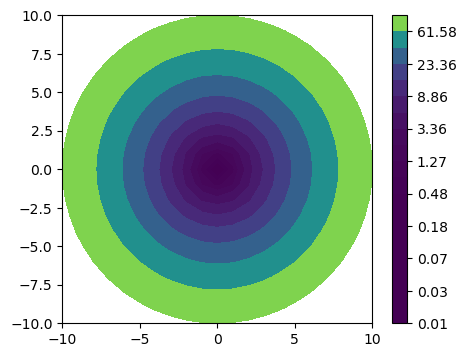

In [63]:
# Sphere function
step = 1
grid_sphere = np.meshgrid(np.arange(-10, 10+step, step), np.arange(-10, 10+step, step))
fv_sphere = func_sphere(grid_sphere)
fig_shpere, ax_shpere = plt.subplots(nrows=1, ncols=1, figsize=(5, 4))
contour_shpere = ax_shpere.contourf(grid_sphere[0], grid_sphere[1], fv_sphere, levels=np.logspace(-2, 2, 20))
fig_shpere.colorbar(contour_shpere, ax=ax_shpere)

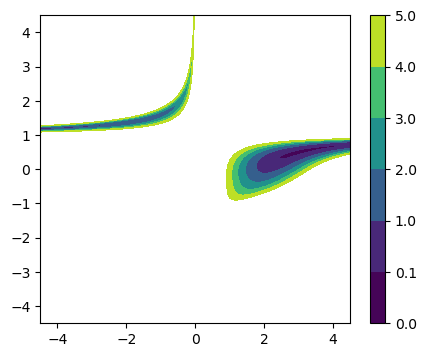

In [64]:
# Beale function
step = .01
grid_beale = np.meshgrid(np.arange(-4.5, 4.5+step, step), np.arange(-4.5, 4.5+step, step))
fv_beale = func_beale(grid_beale)
fig_beale, ax_beale = plt.subplots(nrows=1, ncols=1, figsize=(5, 4))
contour_beale = ax_beale.contourf(grid_beale[0], grid_beale[1], fv_beale, levels=[0, 0.1, 1, 2, 3, 4, 5])
fig_beale.colorbar(contour_beale, ax=ax_beale)

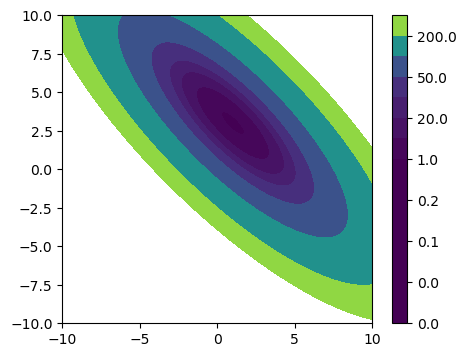

In [65]:
# Booth function
step = .01
grid_booth = np.meshgrid(np.arange(-10, 10+step, step), np.arange(-10, 10+step, step))
fv_booth = func_booth(grid_booth)
fig_booth, ax_booth = plt.subplots(nrows=1, ncols=1, figsize=(5, 4))
contour_booth = ax_booth.contourf(grid_booth[0], grid_booth[1], fv_booth, levels=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.5, 1, 10, 20, 30, 50, 100, 200, 300])
fig_booth.colorbar(contour_booth, ax=ax_booth)

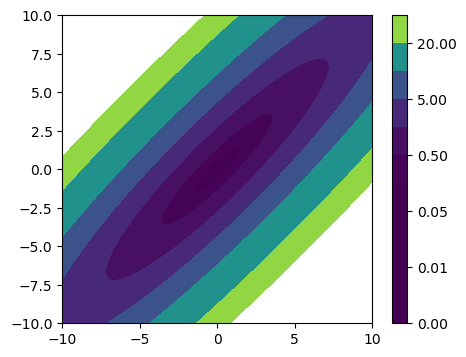

In [66]:
# Matyas function
step = .01
grid_matyas = np.meshgrid(np.arange(-10, 10+step, step), np.arange(-10, 10+step, step))
fv_matyas = func_matyas(grid_matyas)
fig_matyas, ax_matyas = plt.subplots(nrows=1, ncols=1, figsize=(5, 4))
contour_matyas = ax_matyas.contourf(grid_matyas[0], grid_matyas[1], fv_matyas, levels=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 2, 5, 10, 20, 30])
fig_matyas.colorbar(contour_matyas, ax=ax_matyas)

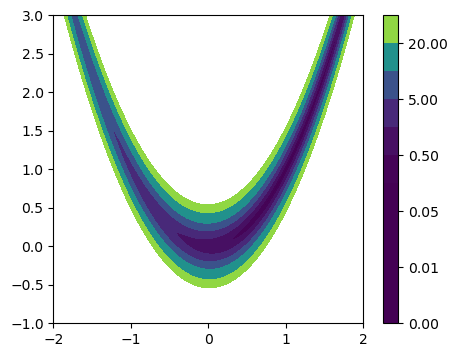

In [67]:
# Rosenbrock function
step = .01
grid_rosenbrock = np.meshgrid(np.arange(-2, 2+step, step), np.arange(-1, 3+step, step))
fv_rosenbrock = func_rosenbrock(grid_rosenbrock)
fig_rosenbrock, ax_rosenbrock = plt.subplots(nrows=1, ncols=1, figsize=(5, 4))
contour_rosenbrock = ax_rosenbrock.contourf(grid_rosenbrock[0], grid_rosenbrock[1], fv_rosenbrock, levels=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 2, 5, 10, 20, 30])
fig_rosenbrock.colorbar(contour_rosenbrock, ax=ax_rosenbrock)

### 4. Main (함수화하여 수행)

In [68]:
######################### Central Difference Method로 함수의 근사 gradient 계산하는 함수
def grad_centraldiff(func, x):
    dim_x = x.shape[0]
    dfdx = np.empty([dim_x, 1])
    h = 1e-6
    for i in np.arange(dim_x):
        dx = np.zeros([dim_x, 1]); dx[i] = 1
        dfdx[i] = (func(x + h*dx) - func(x - h*dx))/(2*h)
    return dfdx

In [69]:
######################### Central Difference Method로 함수의 근사 hessian 계산하는 함수
def hessian_centraldiff(func, x):
    n = len(x)
    H = np.zeros((n, n))
    h = 1e-5
    for i in range(n):      
        for j in range(n):
            x_ij_plus_plus = np.array(x, dtype=float)
            x_ij_plus_minus = np.array(x, dtype=float)
            x_ij_minus_plus = np.array(x, dtype=float)
            x_ij_minus_minus = np.array(x, dtype=float)
            
            x_ij_plus_plus[i] += h
            x_ij_plus_plus[j] += h
            
            x_ij_plus_minus[i] += h
            x_ij_plus_minus[j] -= h
            
            x_ij_minus_plus[i] -= h
            x_ij_minus_plus[j] += h
            
            x_ij_minus_minus[i] -= h
            x_ij_minus_minus[j] -= h
            
            H[i, j] = (func(x_ij_plus_plus) - func(x_ij_plus_minus) - func(x_ij_minus_plus) + func(x_ij_minus_minus)) / (4 * h**2)
    
    return H


In [70]:
######################### Newton's Method
def search_direction_newton(grad, hessian):
    p = -hessian@grad
    return p

In [71]:
######################### Backtracking 함수
# backtracking 알고리즘, 더 포괄적으로 step size alpha를 찾는 line search algorithm은 반드시 함수가 명시적으로 주어져야 한다.
# alpha를 찾기 위해서는 every alpha_try에서 function evaluation을 거쳐야 하기 때문이다.
def backtracking(func, x, grad_x, p, k):
    c1 = 1e-4
    c2 = 0.5

    alpha_try = 1
    x_try = x + alpha_try*p

    i = 0
    while func(x_try) > (func(x) + c1*alpha_try*grad_x.T@p): # Armijo condition
        i = i + 1
        alpha_try = c2*alpha_try
        x_try = x + alpha_try*p
    alpha = alpha_try
    print(f'alpha_{k}_{i} = {alpha}\n')
    return alpha

In [73]:
#################################### Define optimization problem  ####################################
obj = func_beale

#################################### Tolerance setting ####################################
tol = 1e-7

#################################### Initial guess ####################################
x_cur = np.array([[2], 
                  [1]]) # 2 x 1 matrix(※ matlab과 다른 점. numpyp는 vector를 1차원 array, matrix를 2차원 array로 엄밀하게 구분해서 다룬다.)
                      # 따라서 웬만하면 그냥 vector도 matrix form으로 쓰는 걸 추천. 나중에 matrix와 vector를 함께 계산할 일이 많기 때문.
dim_x = x_cur.shape[0] # design space dimension

print(f'x0 : {x_cur.reshape(dim_x)}') # 이렇게 메시지 출력할 때만 vector form으로 쓰자(메시지는 알아보기 쉬워야 하니까).
grad_cur = grad_centraldiff(obj, x_cur) # gradient of x0
k = 0 # Iteration initialization

#################################### NC for optimality check of initial guess ####################################
if np.linalg.norm(grad_cur) < tol:
    print(f'norm of grad at x0 : {np.linalg.norm(grad_cur)} --> x0 is optimum point !')
else:
    print(f'norm of grad at x0 : {np.linalg.norm(grad_cur)} --> x0 is not optimum point. Optimization begins ...')

    #################################### Line search ####################################
    x_new = x_cur # Iteration loop 위해 이름 변경
    grad_new = grad_cur # Iteration loop 위해 이름 변경
    while np.linalg.norm(grad_new) > tol: #### Convergence Check ####
        #################################### Search direction p_cur ####################################
        x_cur = x_new
        grad_cur = grad_new
        hessian_cur = hessian_centraldiff(obj, x_cur)

        p_cur = search_direction_newton(grad_cur, hessian_cur)
        print(f'p_{k} = {p_cur.reshape(dim_x)}')

        #################################### Step length alpha ####################################
        alpha = backtracking(obj, x_cur, grad_cur, p_cur, k) #### backtracking algorithm ####

        # New point x_new
        x_new = x_cur + alpha*p_cur
        grad_new = grad_centraldiff(obj, x_new)
        k = k + 1
        print(f'x_{k} = {x_new.reshape(dim_x)} / |grad(x_{k})| = {np.linalg.norm(grad_new)}')

#################################### Complete Optimization ####################################
print(f'optimization converges --> x* = {x_new.reshape(dim_x)} / |grad(x*)| = {np.linalg.norm(grad_new)}')


x0 : [2 1]
norm of grad at x0 : 55.50000000020816 --> x0 is not optimum point. Optimization begins ...
p_0 = [ -1540.12438803 -10711.50187219]
alpha_0_13 = 0.0001220703125

x_1 = [ 1.81199653 -0.30755638] / |grad(x_1)| = 3.7477542338633656
p_1 = [-18.9124113  30.9107501]
alpha_1_7 = 0.0078125

x_2 = [ 1.66424332 -0.06606615] / |grad(x_2)| = 2.760002301019332
p_2 = [11.41175657 -0.23918808]
alpha_2_4 = 0.0625

x_3 = [ 2.37747811 -0.0810154 ] / |grad(x_3)| = 5.3818597549123295
p_3 = [-45.57374805  63.06289109]
alpha_3_7 = 0.0078125

x_4 = [2.0214332  0.41166344] / |grad(x_4)| = 5.409449994945769
p_4 = [  32.46657406 -143.46796656]
alpha_4_9 = 0.001953125

x_5 = [2.08484448 0.13145256] / |grad(x_5)| = 1.3438343571057434
p_5 = [-0.02499141  7.17769522]
alpha_5_6 = 0.015625

x_6 = [2.08445399 0.24360405] / |grad(x_6)| = 1.6999785183740777
p_6 = [ 11.31993043 -20.18173299]
alpha_6_8 = 0.00390625

x_7 = [2.12867247 0.16476916] / |grad(x_7)| = 1.169183965047159
p_7 = [0.44506831 5.40005263]
al

/tmp/ipykernel_25995/2089291499.py:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  H[i, j] = (func(x_ij_plus_plus) - func(x_ij_plus_minus) - func(x_ij_minus_plus) + func(x_ij_minus_minus)) / (4 * h**2)


x_347 = [2.66104896 0.40010732] / |grad(x_347)| = 0.19260801044228604
p_347 = [-0.34606387  1.5134421 ]
alpha_347_9 = 0.001953125

x_348 = [2.66037306 0.40306327] / |grad(x_348)| = 0.19148761926260097
p_348 = [ 0.59972525 -1.32597929]
alpha_348_9 = 0.001953125

x_349 = [2.66154439 0.40047346] / |grad(x_349)| = 0.1907027411444322
p_349 = [-0.28749479  1.33835543]
alpha_349_9 = 0.001953125

x_350 = [2.66098288 0.40308744] / |grad(x_350)| = 0.18981292126629706
p_350 = [ 0.54616097 -1.1658515 ]
alpha_350_9 = 0.001953125

x_351 = [2.6620496  0.40081038] / |grad(x_351)| = 0.18915862936831693
p_351 = [-0.23839753  1.19102376]
alpha_351_9 = 0.001953125

x_352 = [2.66158398 0.4031366 ] / |grad(x_352)| = 0.18843452536744756
p_352 = [ 0.5008739  -1.03090485]
alpha_352_9 = 0.001953125

x_353 = [2.66256225 0.40112312] / |grad(x_353)| = 0.18787813270110804
p_353 = [-0.19708497  1.0665703 ]
alpha_353_9 = 0.001953125

x_354 = [2.66217732 0.40320626] / |grad(x_354)| = 0.18727431714630177
p_354 = [ 0.46